In [1]:
import os 
from tqdm import tqdm
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

file_injections = 'list_mdc1.txt'

injections = pd.read_csv(file_injections, sep=' ')
injections

,#,t0,tc,mz1,mz2,s1,s1x,s1y,s1z,s2,...,z,distMpc,ra,decl,psi,inc,phi0,snrET_Opt,snrCE_Opt,type
0,1,9.999989e+08,1.000001e+09,4.202228,3.818891,0.0,0.0,0.0,0.0,0.0,...,1.1763,8295.7862,0.444018,1.132247,6.185467,2.802484,1.077702,18.054869,18.913791,1
1,2,9.999993e+08,1.000000e+09,7.135363,3.868220,0.0,0.0,0.0,0.0,0.0,...,1.8898,14858.9823,1.105758,-0.074867,1.949086,1.983881,4.591376,4.149359,9.411527,1
2,3,9.999991e+08,1.000000e+09,5.683621,3.600282,0.0,0.0,0.0,0.0,0.0,...,1.8344,14328.8781,-2.046966,0.667390,0.338622,2.289106,5.200167,3.311479,15.137978,1
3,4,9.999994e+08,1.000000e+09,5.760690,4.733161,0.0,0.0,0.0,0.0,0.0,...,1.8392,14373.8143,-1.707152,0.600842,2.698521,0.908427,1.875371,3.277769,16.029922,1
4,5,9.999984e+08,1.000000e+09,3.046346,2.981137,0.0,0.0,0.0,0.0,0.0,...,1.5493,11646.5618,-1.046111,0.776056,4.081214,0.768849,0.664050,4.716805,13.724386,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
69776,69779,1.002662e+09,1.002663e+09,5.168593,4.894581,0.0,0.0,0.0,0.0,0.0,...,2.5406,21295.0896,1.998510,0.757863,3.215722,1.940822,1.258741,1.555399,3.549328,1
69777,69782,1.002662e+09,1.002663e+09,4.804715,4.059312,0.0,0.0,0.0,0.0,0.0,...,2.6757,22671.0521,0.868927,-0.083710,2.209912,1.591332,2.891243,1.509531,3.054636,1
69778,69786,1.002661e+09,1.002664e+09,3.463670,2.363641,0.0,0.0,0.0,0.0,0.0,...,0.8319,5416.1200,2.822302,-0.650884,2.488832,0.488829,4.032551,20.592091,12.558174,1
69779,69790,1.002662e+09,1.002664e+09,3.782209,2.950254,0.0,0.0,0.0,0.0,0.0,...,1.5926,12048.7501,1.765789,0.393944,2.947775,1.532850,2.863723,0.962713,1.885467,1


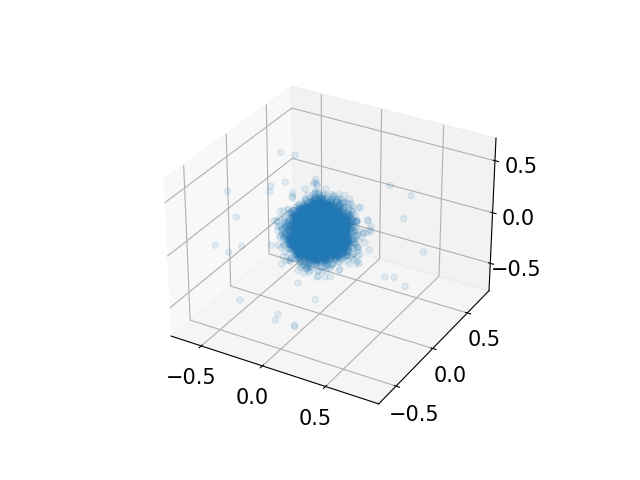

In [21]:
BBH = injections[injections['type']==3]

sx = BBH['s2x']
sy = BBH['s2y']
sz = BBH['s2z']

fig = plt.figure()
ax = fig.add_subplot(projection='3d')
ax.scatter(sx, sy, sz, alpha = 0.1);



100%|███████████████████████████████████████| 6725/6725 [01:13<00:00, 91.32it/s]


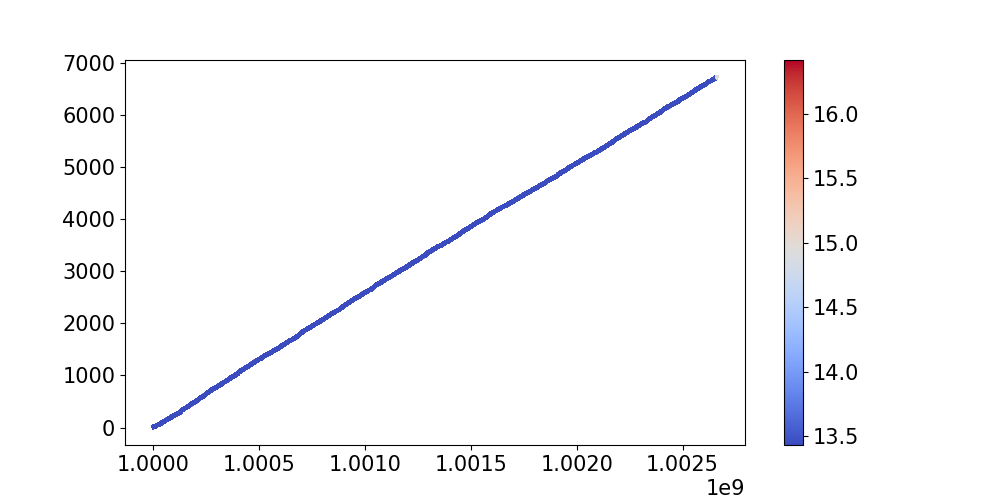

In [27]:
%matplotlib widget
plot = True

N = 100_000

injections = pd.read_csv(file_injections, sep=' ')
injections =  injections[injections['type']==3]
t0 = injections['t0'].to_numpy()#[:N]
tc = injections['tc'].to_numpy()#[:N]
snr = injections['snrET_Opt'].to_numpy()#[:N]
types = injections['type'].to_numpy()


obs_time = tc.max()-t0.min()

diff = tc-t0

if plot:
    plt.rcParams['font.size']=15
    plt.figure(figsize=(10, 5))

    markers = {1:'.', 2:'s', 3:'v'}

    for i, d in tqdm(enumerate(diff), total = len(diff)):
        start = t0[i]
        if i > 1000:
            pass
        x = np.linspace(start, start+d, 100)
        y = i*np.ones(x.shape)
        c = snr[i]*np.ones(y.shape)

        #plt.plot(x, y, '-', color='blue') 
        plt.scatter(x, y, marker=markers[types[i]], s=3, c = c, cmap='coolwarm')
    plt.colorbar()
    plt.show()




(7.242405, 6.575714)

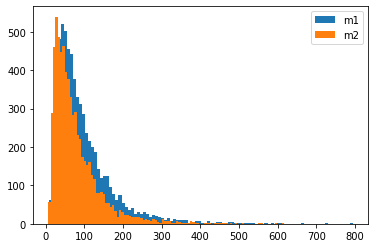

In [3]:
%matplotlib inline
t = 3
m1 = injections[injections['type']==t]['mz1']
m2 = injections[injections['type']==t]['mz2']

plt.hist(m1, 100, label = 'm1');
plt.hist(m2, 100, label = 'm2');
plt.legend()

Mc = ((m1*m2)**(3/5))/((m1+m2)**(1/5))
Mc.min(), Mc.mean(), Mc.max()

np.where(Mc == Mc.min())
m1.to_numpy()[2504], m2.to_numpy()[2504]

z: min = 0.04 - mean = 2.13 - max = 13.29


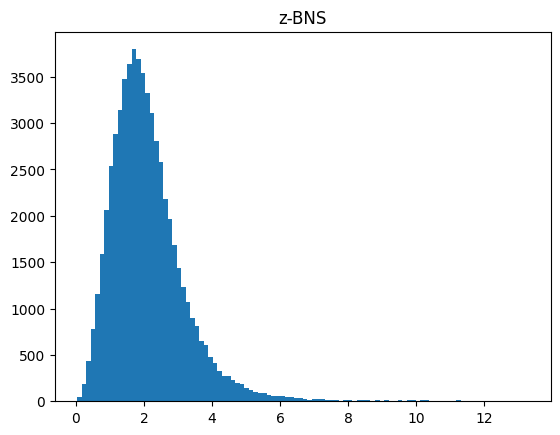

distMpc: min = 0.19 - mean = 17.70 - max = 146.13


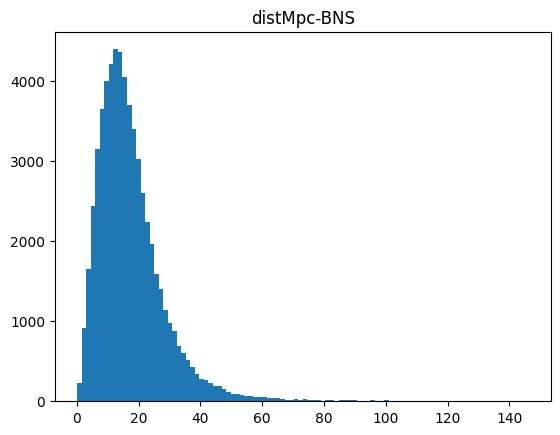

snrET_Opt: min = 0.13 - mean = 5.68 - max = 383.95


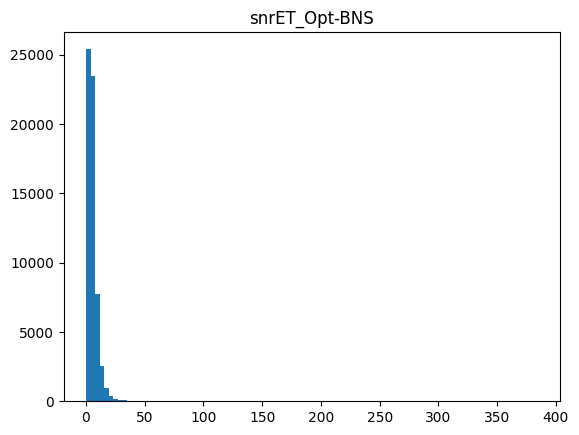

z: min = 0.10 - mean = 3.11 - max = 13.44


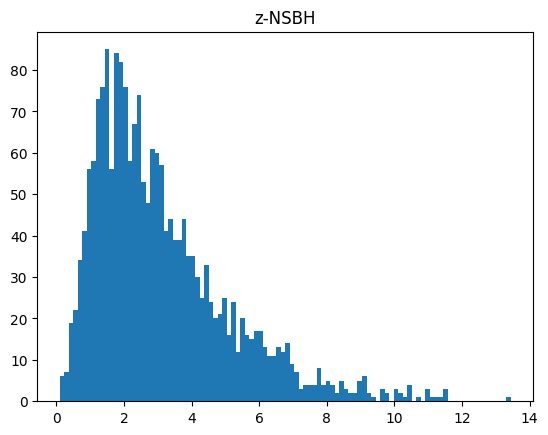

distMpc: min = 0.50 - mean = 28.11 - max = 147.94


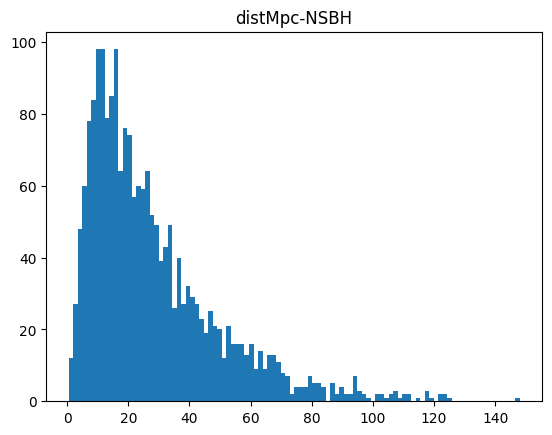

snrET_Opt: min = 0.33 - mean = 6.87 - max = 62.54


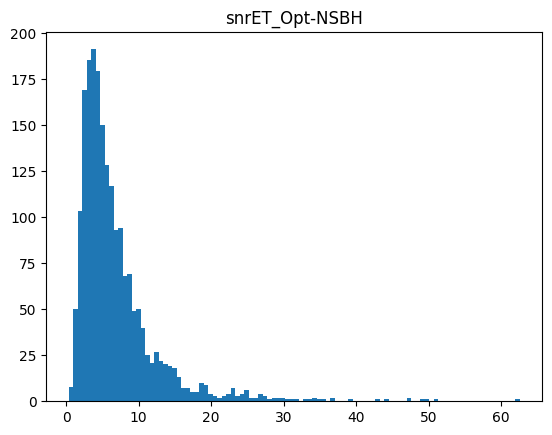

z: min = 0.10 - mean = 3.12 - max = 13.96


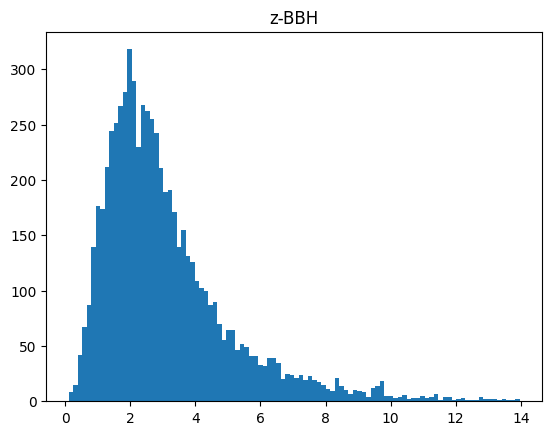

distMpc: min = 0.49 - mean = 28.16 - max = 154.37


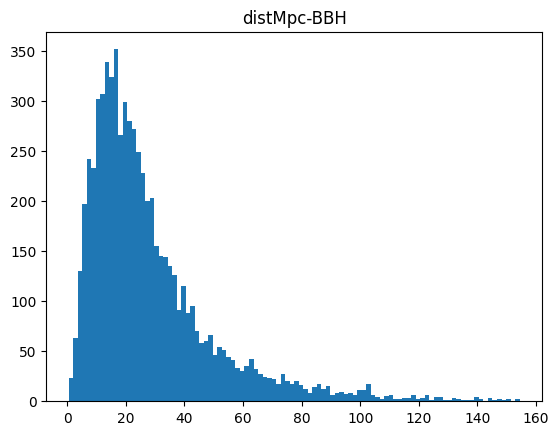

snrET_Opt: min = 0.87 - mean = 28.54 - max = 587.55


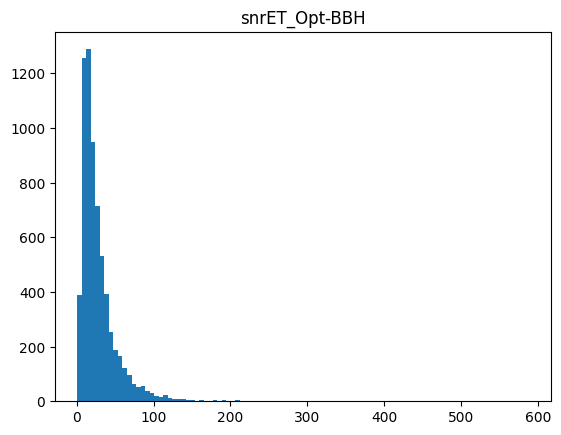

In [12]:
%matplotlib inline
source_type = {'BNS':1, 'NSBH':2, 'BBH':3}
for t in source_type:


    mask = injections['type']==source_type[t]
    for key in injections[mask].keys():
        if not key in ['#', 't0', 'tc']:

            if key in ['z','distMpc', 'snrET_Opt']:
                p = injections[mask][key].to_numpy()

                if 'Mpc' in key:
                    p/=1e3
                print(f'{key}: min = {p.min():.2f} - mean = {p.mean():.2f} - max = {p.max():.2f}')

                plt.hist(p, 100)
                plt.title(key +'-'+t)
                plt.show()
        
        
        

In [3]:
from astropy.cosmology import Planck18
import astropy.units as u

Planck18.luminosity_distance(z=14).to(u.Gpc)

<Quantity 154.84426706 Gpc>

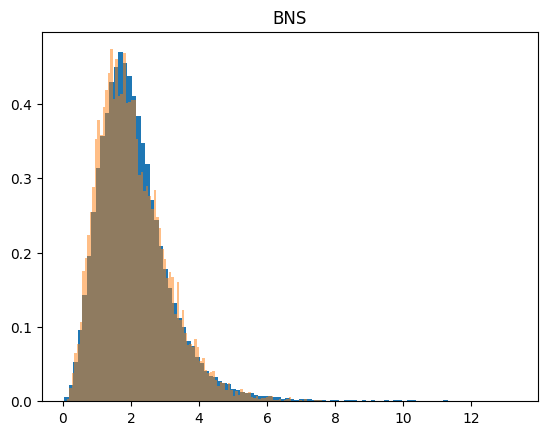

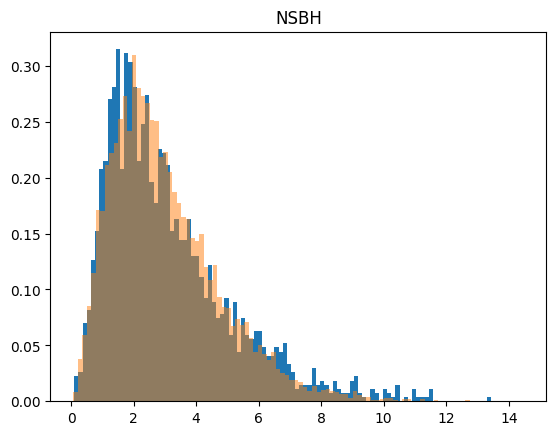

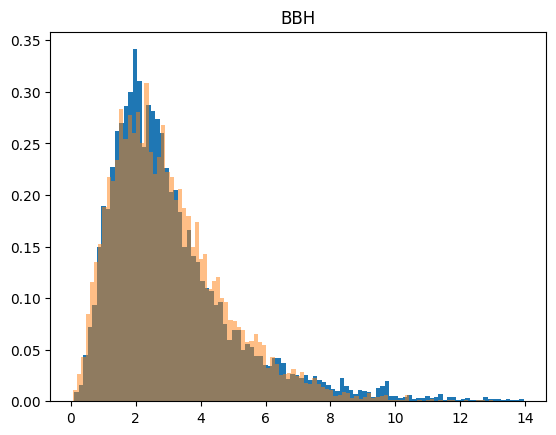

In [7]:
from torch.distributions import Gamma, Weibull

z = Gamma(3, 1).sample((1,10000))
#x = Weibull(2, 1).sample((1,10000))


kwargs = {'BNS': (4.1, 2), 
         'NSBH':(3,1),
         'BBH':(3, 1)
        }

z_true = {'BNS': injections[injections['type']==1]['z'].to_numpy(),
          'NSBH': injections[injections['type']==2]['z'].to_numpy(),
          'BBH': injections[injections['type']==3]['z'].to_numpy()
         }
for kind in z_true:
    z = Gamma(*kwargs[kind]).sample((1,10000))
    
    plt.figure()
    plt.title(kind)
    plt.hist(z_true[kind], 100, density=True, alpha = 1, label = 'real MDC');
    plt.hist(z, 100, density=True, alpha = 0.5, label = 'simulated');
    plt.show()

In [1]:
import torch
from torch.distributions import Gamma
g = torch.Generator()
g.manual_seed(10)
torch.manual_seed(10)

d = Gamma(1, 2, g)
d.sample((1,1))

tensor([[0.1432]])

In [7]:
help(d.sample)

Help on method sample in module torch.distributions.distribution:

sample(sample_shape: torch.Size = torch.Size([])) -> torch.Tensor method of torch.distributions.gamma.Gamma instance
    Generates a sample_shape shaped sample or sample_shape shaped batch of
    samples if the distribution parameters are batched.



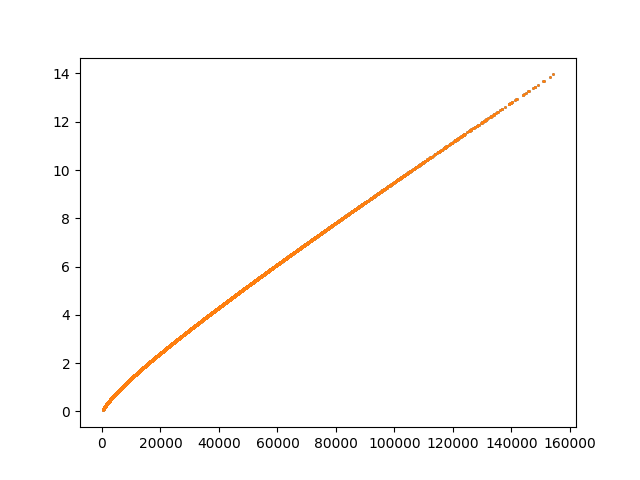

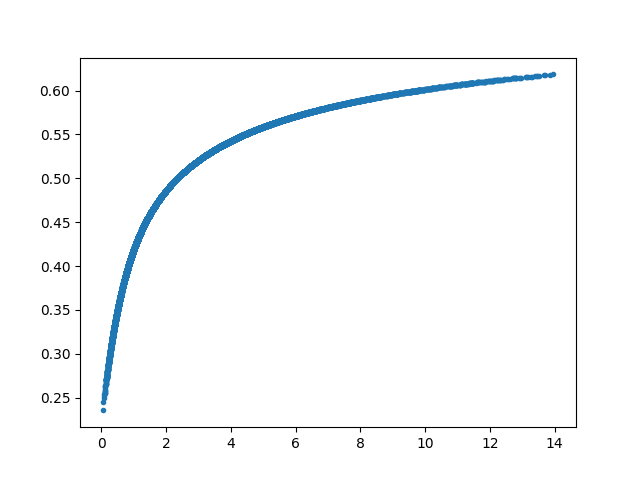

In [11]:
%matplotlib widget
from astropy.cosmology import Planck18, Planck15, Planck13
import astropy.units as u

cosmology = Planck18

"""
THEY SEEMS TO HAVE USED PLANCK18
"""

z_true = injections['z'].to_numpy()
dL_true = injections['distMpc'].to_numpy()

dL = np.array(cosmology.luminosity_distance(z_true))

plt.plot(dL_true, z_true, '.', markersize=2)
plt.plot(dL, z_true, '.', markersize=2)
plt.show()

plt.figure()
plt.plot(z_true, abs(dL - dL_true) , '.')
plt.show()


In [17]:
cosmology.lookback_distance(torch.as_tensor((2, 30))).value



array([3222.39748647, 4196.73772429])

In [57]:
diff.mean()
types_dict = {1:'BNS', 2:'NSBH', 3:'BBH'}
for t in range(1, 4):
    print(types_dict[t], 'min', 'mean', 'max')
    print(f'{diff[types==t].min():.2f}, {diff[types==t].mean():.2f}, {diff[types==t].max():.2f}')

BNS min mean max
63.81, 1281.78, 8191.99
NSBH min mean max
31.60, 477.72, 2047.98
BBH min mean max
0.13, 32.69, 511.96


In [3]:
injections['lambda1']

0         107.277557
1          12.209843
2          82.561157
3          75.874336
4        1645.042788
            ...     
69776     576.626284
69777    1039.433960
69778     123.484807
69779     578.700824
69780     365.090032
Name: lambda1, Length: 69781, dtype: float64

In [99]:
times = np.linspace(t0.min(), tc.max(), N)
overlaps = []
'''
for t in tqdm(times):
    mask = (t0<=t) & (t<=tc)
    _, counts = np.unique(mask, return_counts=True)
    overlaps.append(counts[1])
'''    
    
def get_overlap(i):
    t = times[i]
    _, counts = np.unique(mask, return_counts=True)
    return counts[1]

import multiprocess as mp

with mp.Pool(4) as p:
    
    for c in tqdm(p.imap(get_overlap, range(len(times))), total = len(times)):
        overlaps.append(c)
    

100%|█████████████████████████████████| 100000/100000 [00:42<00:00, 2337.87it/s]


In [24]:
t0.min(), tc.max()

3600*24*30 + 1000000000

1002592000

Text(0.5, 0, 'number of overlaps')

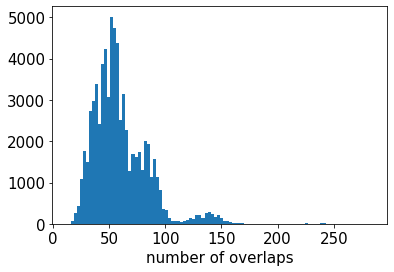

In [130]:
#count overlaps
t0_ = t0[:, None]
tc_ = tc[:, None]

mask = (t0 <= tc_) & (tc >=t0_)
overlaps = np.triu(mask, k=1).nonzero()

_, counts = np.unique(overlaps, return_counts=True)

plt.figure()
plt.hist(counts, 100);
plt.xlabel('number of overlaps')


# PLOT PRIORS

In [38]:
import corner
drops = ['#', 't0', 'tc', 'type', 'snrCE_Opt', 'lambda1', 'lambda2']

BNS = injections[injections['type']==1]
NSBH = injections[injections['type']==2]
BBH = injections[injections['type']==3]


BNS = BNS.drop(drops, axis=1)
NSBH = NSBH.drop(drops, axis=1)
BBH = BBH.drop(drops, axis=1)
    

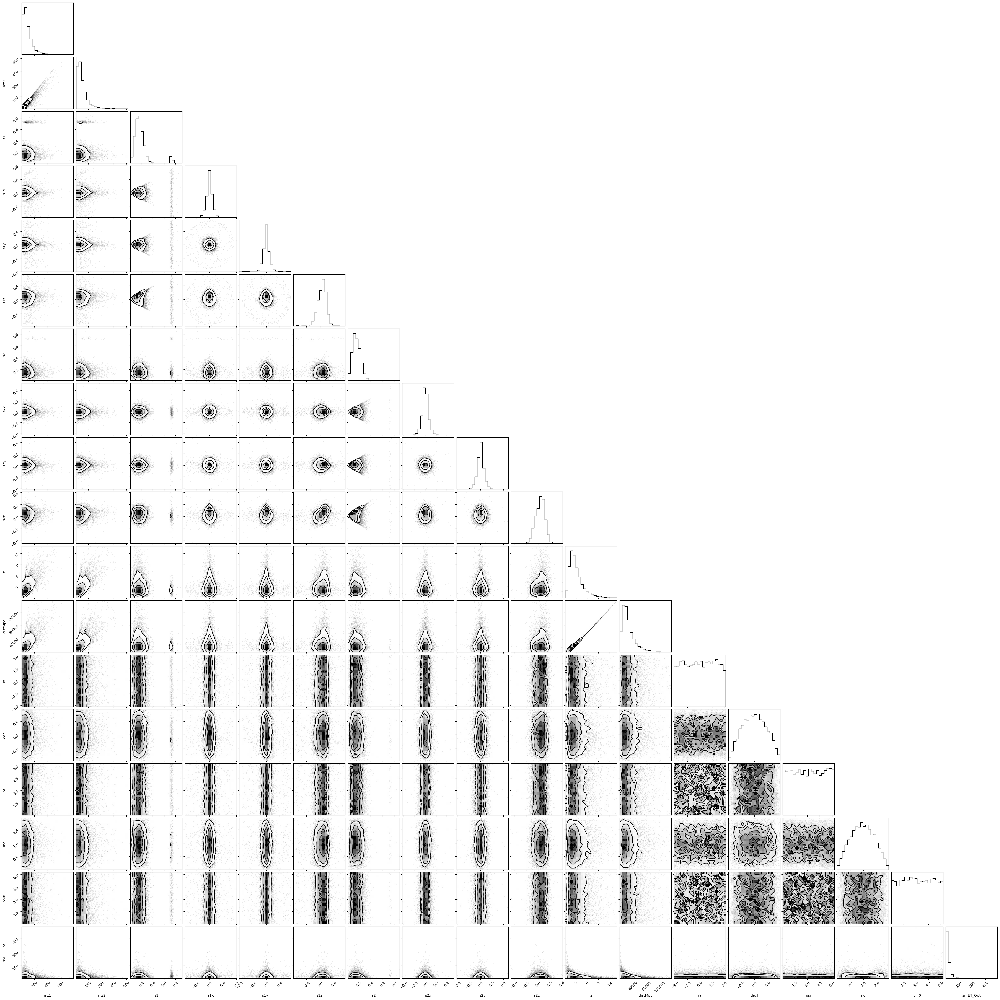

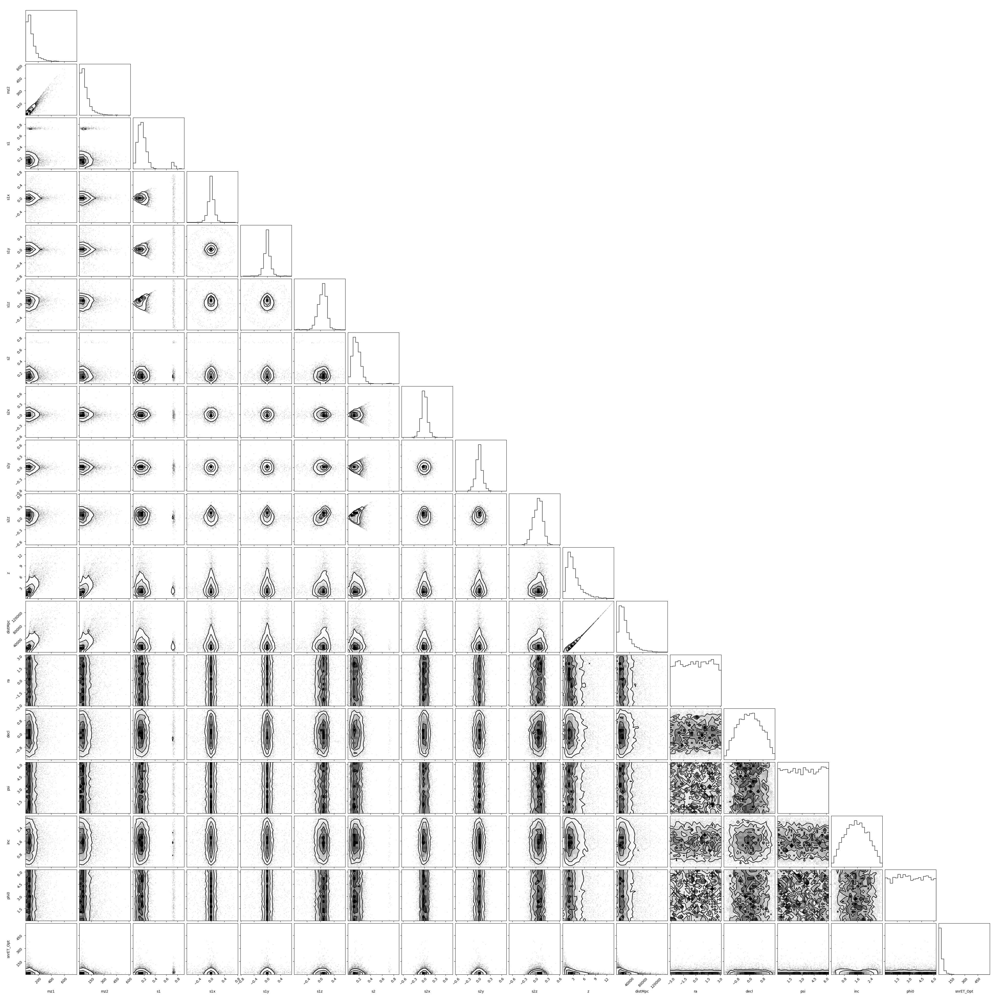

In [45]:
corner.corner(BBH.to_dict(orient='list'))

In [9]:
from pycbc.detector import Detector

E1 = Detector('E1')

E1.optimal_orientation

<bound method Detector.optimal_orientation of <pycbc.detector.Detector object at 0x7f875f073a30>>

In [14]:
import lalsimulation

help(lalsimulation.SimDetectorStrainREAL8TimeSeries)

Help on built-in function SimDetectorStrainREAL8TimeSeries in module lalsimulation._lalsimulation:

SimDetectorStrainREAL8TimeSeries(...)
    SimDetectorStrainREAL8TimeSeries(REAL8TimeSeries hplus, REAL8TimeSeries hcross, REAL8 right_ascension, REAL8 declination, REAL8 psi, Detector detector) -> REAL8TimeSeries



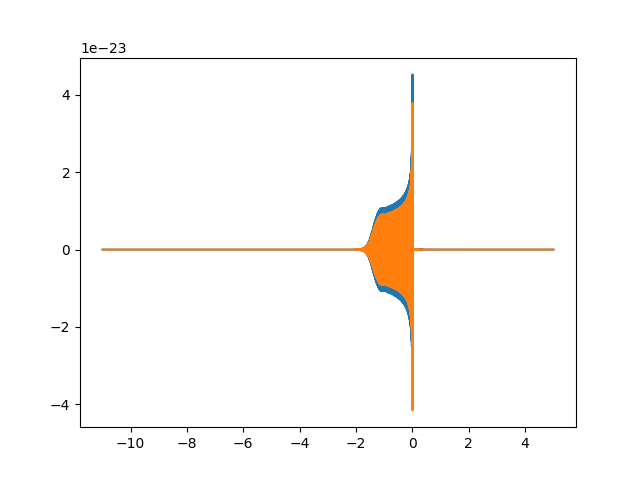

In [37]:
%matplotlib widget
from pycbc.waveform import get_td_waveform, get_fd_waveform
from pycbc.detector import Detector
import matplotlib.pyplot as plt
from deepfastet.simulations import ETArmDetector as GWDetector
#from hyperion.simulations import GWDetector
import numpy as np

E1 = Detector('E1')
d = GWDetector('ET1')
#d.reference_time = E1.reference_time

fs = 1024*2

hp, hc = get_td_waveform(approximant = 'IMRPhenomPv2', mass1 = 6, mass2 = 6, f_lower = 50, delta_t = 1/fs, distance=1000)

#plt.plot(hp.sample_times, hp)
#plt.plot(hp.sample_times, hc)




kwargs = {'ra':0, 'dec':0, 'polarization':0}

h_pycbc = E1.project_wave(hp, hc, method = 'constant',  **kwargs)

h_hyperion = d.project_wave(hp, hc, **kwargs)



a, b = E1.antenna_pattern(right_ascension=0, declination=0, polarization=0, t_gps = np.mean(hp.sample_times))
plt.figure()
plt.plot(h_pycbc.sample_times, h_pycbc)
plt.plot(h_pycbc.sample_times, h_hyperion)

In [25]:
np.rad2deg(E1.latitude), np.rad2deg(d.latitude)

(43.63141447003932, 43.631414472074304)

In [33]:
d.time_delay_from_earth_center(ra =0, dec=0), E1.time_delay_from_earth_center(right_ascension=0, declination=0, t_gps = d.reference_time)

NameError: name 'GWDetector' is not defined

In [31]:
d.antenna_pattern_functions(ra=0, dec=0, polarization=0, t_gps = d.reference_time), 

((-0.2572661023434377, 0.49686868910269877),)

In [48]:
d.reference_time, E1.reference_time

(1126259462.0, 1126259462.0)

In [31]:
import bilby
ET = bilby.gw.detector.get_empty_interferometer("ET")
ET

[Interferometer(name='ET1', power_spectral_density=PowerSpectralDensity(psd_file='/Users/federicodesanti/opt/miniconda3/lib/python3.9/site-packages/bilby/gw/detector/noise_curves/ET_D_psd.txt', asd_file='None'), minimum_frequency=10.0, maximum_frequency=2048.0, length=10.0, latitude=43.631414472222225, longitude=10.504496611111112, elevation=51.884, xarm_azimuth=70.56740000000002, yarm_azimuth=130.5674, xarm_tilt=0.0, yarm_tilt=0.0),
 Interferometer(name='ET2', power_spectral_density=PowerSpectralDensity(psd_file='/Users/federicodesanti/opt/miniconda3/lib/python3.9/site-packages/bilby/gw/detector/noise_curves/ET_D_psd.txt', asd_file='None'), minimum_frequency=10.0, maximum_frequency=2048.0, length=10.0, latitude=43.56317474679433, longitude=10.562917819702237, elevation=51.884, xarm_azimuth=310.5674, yarm_azimuth=370.5674000000001, xarm_tilt=0.0, yarm_tilt=0.0),
 Interferometer(name='ET3', power_spectral_density=PowerSpectralDensity(psd_file='/Users/federicodesanti/opt/miniconda3/lib/p

In [111]:
"""Plot a time domain and Fourier domain waveform together in the time domain.
Note that without special cleanup the Fourier domain waveform will exhibit
the Gibb's phenomenon. (http://en.wikipedia.org/wiki/Gibbs_phenomenon)
"""

import matplotlib.pyplot as pp
from pycbc import types, fft, waveform


# Get a time domain waveform
hp, hc = waveform.get_td_waveform(approximant='IMRPhenomPv2',
                             mass1=6, mass2=6, delta_t=1.0/4096, f_lower=40)

# Get a frequency domain waveform
sptilde, sctilde = waveform. get_fd_waveform(approximant='IMRPhenomPv2',
                             mass1=6, mass2=6, delta_f=1/4, f_lower=40)

# FFT it to the time-domain
tlen = int(1.0 / hp.delta_t / sptilde.delta_f)
#sptilde.resize(tlen/2 + 1)
sp = types.TimeSeries(types.zeros(tlen), delta_t=hp.delta_t)
fft.ifft(sptilde, sp)
pp.figure()
pp.plot(sp.sample_times, sp, label="TaylorF2 (IFFT)")
pp.plot(hp.sample_times, hp, label='SEOBNRv4')

pp.ylabel('Strain')
pp.xlabel('Time (s)')
pp.legend()
pp.show()

ValueError: For C2R IFFT, len(invec) must be nbatch*(size/2 + 1)

/Users/federicodesanti/opt/miniconda3/lib/python3.9/site-packages/matplotlib/cbook/__init__.py:1298: ComplexWarning: Casting complex values to real discards the imaginary part
  return np.asarray(x, float)


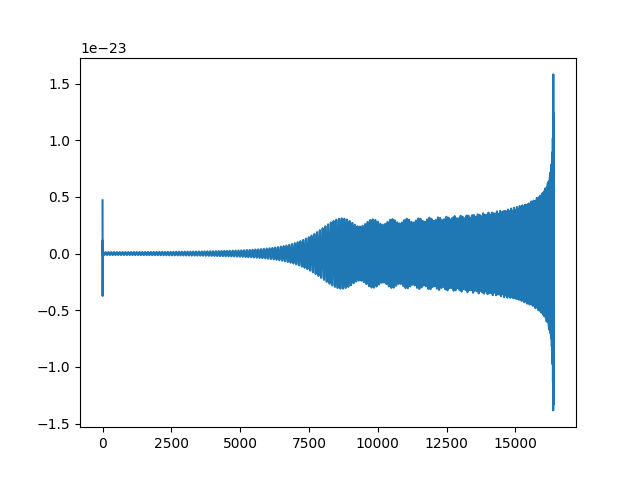

In [112]:
plt.figure()
plt.plot(np.fft.ifft(sptilde))
plt.show()


In [121]:
if __name__ == '__main__':
    %matplotlib widget
    import os
    from tqdm import tqdm
    import multiprocess as mp
    from pycbc.waveform import get_td_waveform, get_fd_waveform
    
    N = 100
    
    def get_wvf(i):
        fs = 2048
        hp, hc = get_td_waveform(approximant = 'IMRPhenomXPHM', mass1 = 100, mass2 = 100, f_lower = 2, delta_t = 1/fs, distance=1000)
        return hp, hc
    
    with mp.Pool(os.cpu_count()) as p:
        
        for result in tqdm(p.imap(get_wvf, range(N)), total=N):
            hp, hc = result
    
        print(hp.duration)
   

100%|█████████████████████████████████████████| 100/100 [00:24<00:00,  4.07it/s]


1024.0


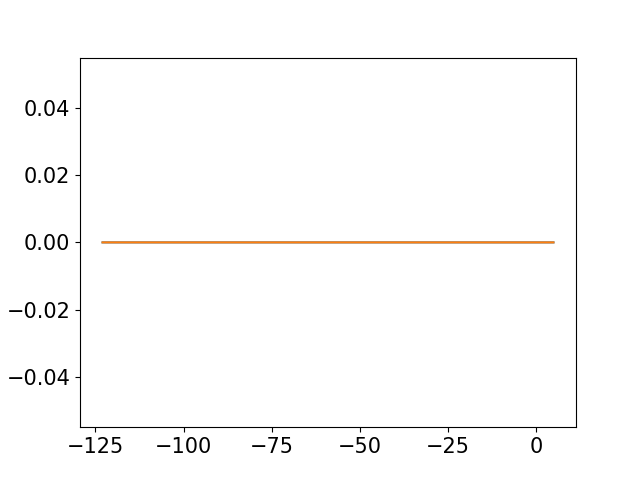

CPU times: user 548 ms, sys: 51.8 ms, total: 600 ms
Wall time: 491 ms


In [72]:
%%time
%matplotlib widget
import torch

from pycbc.waveform import get_td_waveform
fs = 1024

hp, hc = get_td_waveform(approximant = 'IMRPhenomXPHM', mass1 = torch.tensor(70).double(), mass2 = 6, f_lower=15, delta_t = 1/fs, distance=100, 
                        spin1x = 0.0, spin2x=0.0)

hp1, hc1 = get_td_waveform(approximant = 'IMRPhenomXPHM', mass1 = 70, mass2 = 6, f_lower=15, delta_t = 1/fs, distance=100, 
                        spin1x = 0.0, spin2x=0.0)

plt.figure()
plt.plot(hp.sample_times, hp-hp1)
plt.plot(hc.sample_times, hc-hc1)
plt.show()


In [27]:
help(get_td_waveform)

Help on function get_td_waveform in module pycbc.waveform.waveform:

get_td_waveform(template=None, **kwargs)
    Return the plus and cross polarizations of a time domain waveform.
    
    Parameters
    ----------
    template: object
        An object that has attached properties. This can be used to subsitute
        for keyword arguments. A common example would be a row in an xml table.
    mass1 : {None, float}
        The mass of the first component object in the binary (in solar masses).
    mass2 : {None, float}
        The mass of the second component object in the binary (in solar masses).
    spin1x : {0.0, float}
        The x component of the first binary component's dimensionless spin.
    spin1y : {0.0, float}
        The y component of the first binary component's dimensionless spin.
    spin1z : {0.0, float}
        The z component of the first binary component's dimensionless spin.
    spin2x : {0.0, float}
        The x component of the second binary component's dim